<a href="https://colab.research.google.com/github/Guhan2348519/RM-CLASS-TASK/blob/main/2348519_lab7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.tree import export_graphviz
import pydotplus
from sklearn.metrics import confusion_matrix
from IPython.display import Image

In [ ]:
# Load your dataset
data = pd.read_csv('/content/drive/MyDrive/employee_data (1) 2 - employee_data (1) 2.csv')


In [ ]:
data.shape


(14249, 10)

In [ ]:
data.head(5)

,avg_monthly_hrs,department,filed_complaint,last_evaluation,n_projects,recently_promoted,salary,satisfaction,status,tenure
0,221,engineering,NaN,0.932868,4,NaN,low,0.829896,Left,5.0
1,232,support,NaN,NaN,3,NaN,low,0.834544,Employed,2.0
2,184,sales,NaN,0.788830,3,NaN,medium,0.834988,Employed,3.0
3,206,sales,NaN,0.575688,4,NaN,low,0.424764,Employed,2.0
4,249,sales,NaN,0.845217,3,NaN,low,0.779043,Employed,3.0


In [ ]:
data.isnull().sum()

avg_monthly_hrs          0
department             709
filed_complaint      12191
last_evaluation       1532
n_projects               0
recently_promoted    13949
salary                   0
satisfaction           181
status                   0
tenure                 181
dtype: int64

In [ ]:
data['avg_monthly_hrs'].fillna(data['avg_monthly_hrs'].mean(), inplace=True)
data['last_evaluation'].fillna(data['last_evaluation'].mean(), inplace=True)
data['satisfaction'].fillna(data['satisfaction'].mean(), inplace=True)
data['tenure'].fillna(data['tenure'].median(), inplace=True)

In [ ]:
data['department'].fillna(data['department'].mode()[0], inplace=True)
data['filed_complaint'].fillna(0, inplace=True)
data['recently_promoted'].fillna(0, inplace=True)
data['salary'].fillna(data['salary'].mode()[0], inplace=True)

In [ ]:
data.isnull().sum()

avg_monthly_hrs      0
department           0
filed_complaint      0
last_evaluation      0
n_projects           0
recently_promoted    0
salary               0
satisfaction         0
status               0
tenure               0
dtype: int64

In [ ]:
data.head(10)

,avg_monthly_hrs,department,filed_complaint,last_evaluation,n_projects,recently_promoted,salary,satisfaction,status,tenure
0,221,engineering,0.0,0.932868,4,0.0,low,0.829896,Left,5.0
1,232,support,0.0,0.718477,3,0.0,low,0.834544,Employed,2.0
2,184,sales,0.0,0.788830,3,0.0,medium,0.834988,Employed,3.0
3,206,sales,0.0,0.575688,4,0.0,low,0.424764,Employed,2.0
4,249,sales,0.0,0.845217,3,0.0,low,0.779043,Employed,3.0
5,140,sales,0.0,0.589097,4,0.0,medium,0.660020,Employed,4.0
6,121,sales,1.0,0.625399,3,0.0,low,0.835571,Employed,3.0
7,150,engineering,0.0,0.644586,4,0.0,low,0.796683,Employed,3.0
8,215,engineering,1.0,0.524114,3,0.0,medium,0.715005,Employed,7.0
9,269,support,0.0,0.909364,5,0.0,medium,0.994037,Employed,2.0


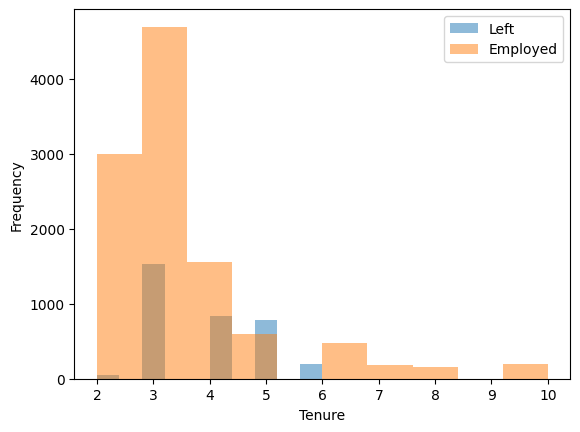

In [ ]:
# Convert 'status' to numerical (0 for 'Employed' and 1 for 'Left')
data['status_numerical'] = data['status'].map({'Employed': 0, 'Left': 1})

# Visualize the distribution of employee tenure using a histogram
plt.hist(data[data['status_numerical'] == 1]['tenure'], alpha=0.5, label='Left')
plt.hist(data[data['status_numerical'] == 0]['tenure'], alpha=0.5, label='Employed')
plt.xlabel('Tenure')
plt.ylabel('Frequency')
plt.legend()

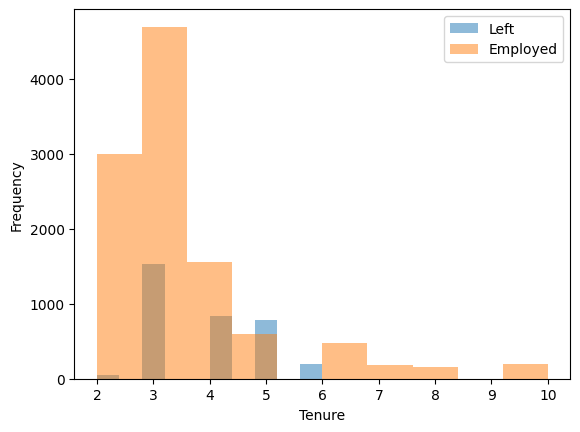

In [ ]:
# Visualize the distribution of employee tenure using a histogram
plt.hist(data[data['status'] == 'Left']['tenure'], alpha=0.5, label='Left')
plt.hist(data[data['status'] == 'Employed']['tenure'], alpha=0.5, label='Employed')
plt.xlabel('Tenure')
plt.ylabel('Frequency')
plt.legend()

<Axes: xlabel='status', ylabel='satisfaction'>

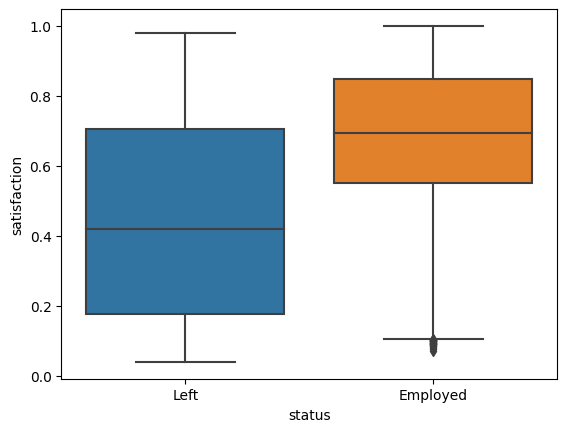

In [ ]:
# Create a boxplot for job satisfaction scores
sns.boxplot(x='status', y='satisfaction', data=data)


([<matplotlib.patches.Wedge at 0x7809e9b68d30>,
 [Text(-0.8064592186333274, 0.7480798945843441, 'Employed'),
  Text(0.8064592536534737, -0.7480798568312627, 'Left')],
 [Text(-0.43988684652726945, 0.40804357886418763, '76.2%'),
  Text(0.4398868656291674, -0.4080435582715978, '23.8%')])

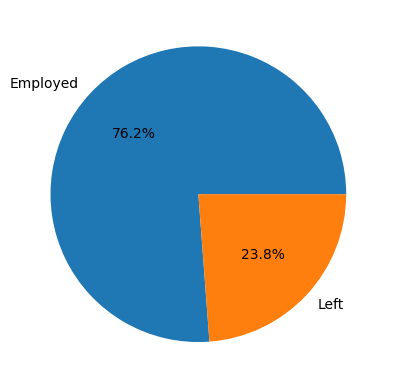

In [ ]:
# Generate a pie chart for attrition distribution
attrition_counts = data['status'].value_counts()
plt.pie(attrition_counts, labels=attrition_counts.index, autopct='%1.1f%%')


<Axes: xlabel='satisfaction', ylabel='last_evaluation'>

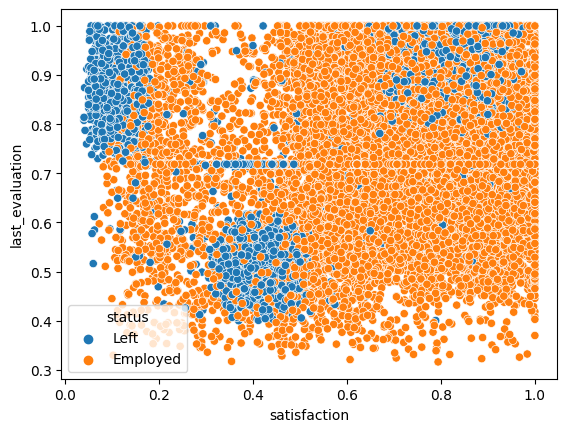

In [ ]:
# Create a scatter plot to explore the relationship between satisfaction and last evaluation
sns.scatterplot(x='satisfaction', y='last_evaluation', hue='status', data=data)

In [ ]:
# Split the dataset into a training set and a testing set
X = data[['tenure', 'satisfaction', 'n_projects']]
y = data['status']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Build a decision tree classifier
clf_gini = DecisionTreeClassifier(criterion='gini')
clf_entropy = DecisionTreeClassifier(criterion='entropy')

clf_gini.fit(X_train, y_train)
clf_entropy.fit(X_train, y_train)
clf_pruned = DecisionTreeClassifier(criterion='gini', max_depth=3)
clf_pruned.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3)

In [ ]:
dot_data_gini = export_graphviz(clf_gini, out_file=None,
                                feature_names=X.columns,
                                class_names=['Employed', 'Left'],
                                filled=True, rounded=True,
                                special_characters=True,
                                max_depth=3)

In [ ]:

dot_data_gini = export_graphviz(clf_gini, out_file=None,
                                feature_names=X.columns,
                                class_names=['Employed', 'Left'],
                                filled=True, rounded=True,
                                special_characters=True)
graph_gini = pydotplus.graph_from_dot_data(dot_data_gini)
Image(graph_gini.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.936441 to fit



In [ ]:
# Evaluate the decision tree models
y_pred_gini = clf_gini.predict(X_test)
y_pred_entropy = clf_entropy.predict(X_test)

# Calculate metrics
accuracy_gini = metrics.accuracy_score(y_test, y_pred_gini)
precision_gini = metrics.precision_score(y_test, y_pred_gini, average='weighted')
recall_gini = metrics.recall_score(y_test, y_pred_gini, average='weighted')
f1_score_gini = metrics.f1_score(y_test, y_pred_gini, average='weighted')

In [ ]:
print("Accuracy (Gini Impurity):", accuracy_gini)
print("Precision (Gini Impurity):", precision_gini)
print("Recall (Gini Impurity):", recall_gini)
print("F1 Score (Gini Impurity):", f1_score_gini)

Accuracy (Gini Impurity): 0.9336842105263158
Precision (Gini Impurity): 0.9351172703269083
Recall (Gini Impurity): 0.9336842105263158
F1 Score (Gini Impurity): 0.934239913858166


Text(0.5, 1.0, 'Confusion Matrix (Gini Impurity)')

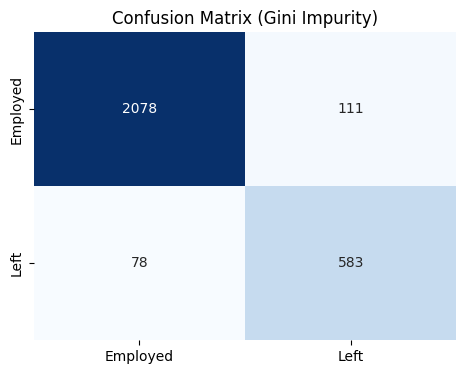

In [ ]:
# Evaluate the decision tree model with entropy criterion
y_pred_entropy = clf_entropy.predict(X_test)

# Calculate metrics for the model with entropy criterion
accuracy_entropy = metrics.accuracy_score(y_test, y_pred_entropy)
precision_entropy = metrics.precision_score(y_test, y_pred_entropy, average='weighted')
recall_entropy = metrics.recall_score(y_test, y_pred_entropy, average='weighted')
f1_score_entropy = metrics.f1_score(y_test, y_pred_entropy, average='weighted')
# Create a diverging bar chart for the confusion matrix
confusion_matrix_gini = confusion_matrix(y_test, y_pred_gini)
confusion_matrix_entropy = confusion_matrix(y_test, y_pred_entropy)

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix_gini, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Employed', 'Left'], yticklabels=['Employed', 'Left'])
plt.title('Confusion Matrix (Gini Impurity)')


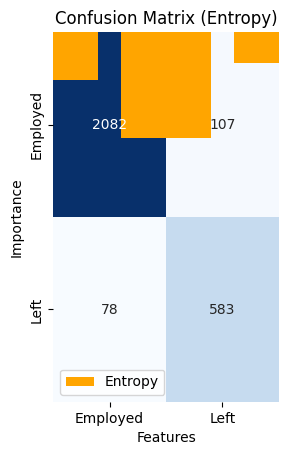

In [ ]:
plt.subplot(1, 2, 2)
sns.heatmap(confusion_matrix_entropy, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Employed', 'Left'], yticklabels=['Employed', 'Left'])
plt.title('Confusion Matrix (Entropy)')

# Visualize feature importance for entropy criterion
feature_importance_entropy = clf_entropy.feature_importances_

plt.bar(X.columns, feature_importance_entropy, label='Entropy', color='orange')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.legend()


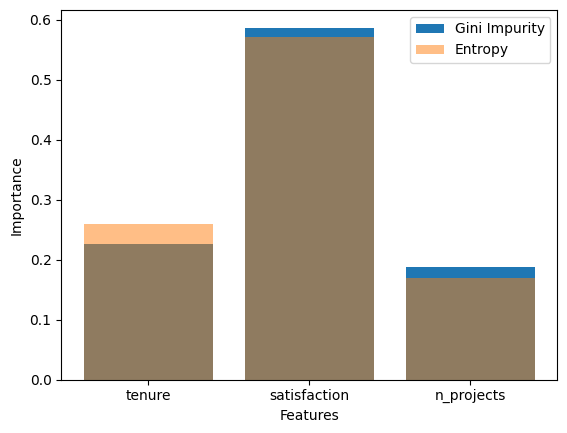

In [ ]:
# Visualize feature importance for Gini impurity and entropy criteria
feature_importance_gini = clf_gini.feature_importances_
feature_importance_entropy = clf_entropy.feature_importances_

plt.bar(X.columns, feature_importance_gini, label='Gini Impurity')
plt.bar(X.columns, feature_importance_entropy, label='Entropy', alpha=0.5)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.legend()